<a href="https://colab.research.google.com/github/ABD-01/Siamese-NN/blob/master/Siamese_ORL_ResNet/Siamese_ORL(ResNet)v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import glob
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as Image
import cv2
from itertools import combinations 
from collections import OrderedDict
from tqdm import tqdm
from sklearn.decomposition import PCA
 
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
 
import torchvision
import torchvision.transforms as transforms

In [ ]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 5.7MB/s 


In [ ]:
from mtcnn.mtcnn import MTCNN

In [ ]:
torch.cuda.is_available()

True

In [ ]:
def seed_init():
    np.random.seed(0)
    random.seed(0)
    torch.manual_seed(0)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(0)
        torch.cuda.manual_seed_all(0)
    torch.backends.cudnn.enabled = False
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
 
# ref : https://discuss.pytorch.org/t/random-seed-initialization/7854/19

In [ ]:
seed_init()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/att_face_dataset/'

In [ ]:
class CustomDataset(Dataset):
 
    def __init__(self, path, transform=transforms.ToTensor()):
        self.dirs = glob.glob(f'{path}*/')
        self.transform = transform
        
        self.total_images = self._get_images(self.dirs, self.transform)
 
    def _get_images(self, dirs, transform):
        ti = []
        for dir in tqdm(dirs):
#             images = [transform(Image.open(image)).squeeze() for image in glob.glob(f'{dir}*')]
            images = [transform(Image.open(image)) for image in glob.glob(f'{dir}*')]
            ti.append(images)
        return ti
        
    def __len__(self):
        return self.dirs.__len__()
    
    def __getitem__(self,idx):
        return torch.stack(self.total_images[idx], dim=0)
# ref : https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

In [ ]:
process = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0.4422, std=0.1931),
])
 
# dataset = list(att_dataset)
# torch.cat(dataset).mean() , torch.cat(dataset).std()
# #  (tensor(0.4417), tensor(0.1958))

In [ ]:
att_dataset = CustomDataset(PATH, transform=process)

100%|██████████| 40/40 [01:05<00:00,  1.65s/it]


In [ ]:
att_dataset[0][0].shape

torch.Size([1, 224, 224])

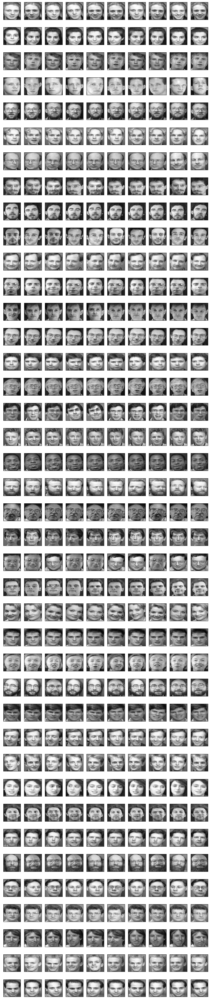

In [ ]:
_,axxr = plt.subplots(40,10, figsize=(12,60))
for i in range(40):
    for j in range(10):
        axxr[i][j].imshow(att_dataset[i][j].squeeze(), cmap='gray')
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
plt.show()

In [ ]:
dataset = list(att_dataset)
torch.cat(dataset).mean() , torch.cat(dataset).std()
#  (tensor(0.4417), tensor(0.1958))

(tensor(-7.0951e-05), tensor(0.9998))

In [ ]:
def triplet_loss(anchor, positive, negative, margin=1):
    pos_dist = (anchor - positive).pow(2).sum(-1) #.pow(.5)
    neg_dist = (anchor - negative).pow(2).sum(-1) #.pow(.5)
    loss = F.relu(pos_dist - neg_dist + margin)
    return loss.mean()
 
# ref: https://github.com/adambielski/siamese-triplet/blob/master/losses.py#L24

In [ ]:
def get_random_triplets(embeddings) -> torch.Tensor:
    '''
    For each image in data (Anchor), randomly sample a Positive image from its class.  
    Then from each of the other classes sample one image (randomly) as the Negative. Hence, for every Anchor
    you will have 1 randomly selected positive from it's class and randomly selected Negative from each of the n-1 classes 
    where n is total number of classes.  For every Anchor image you would have n-1 triplets.
    So if you're having 3 classes of 10 images each then you would have 60 triplets. 
    '''
 
 
    triplets = []
    temp_list = list(range(len(embeddings)))
    for i, embedding in enumerate(embeddings):
        aclass = temp_list.pop(i)  ## Anchor class
 
        temp_list2 = list(range(len(embedding)))
        for j, anchor in enumerate(embedding):  ## for anchor in anchor class
            aidx = temp_list2.pop(0)
            if len(temp_list2)<1:
                break
            pidx = random.choice(temp_list2)
            positive = embedding[pidx]
 
            for nidx in temp_list:
                negative = random.choice(embeddings[nidx])
 
                # print(f"Anchor Class : {aclass}; anchor image : {j}{aidx}, positive image : {pidx}; negative class : {nidx}")
                triplets.append(torch.stack([anchor, positive, negative], dim=0))
 
            # temp_list2.insert(j,aidx)
            # print()
        temp_list.insert(i, aclass)
 
    return torch.stack(triplets, dim=0)

In [ ]:
def dist(enc1,enc2):
    return (enc1 - enc2).pow(2).sum(-1)#.pow(.5)

In [ ]:
dataset = torch.stack(dataset)
dataset.shape

torch.Size([40, 10, 1, 224, 224])

In [ ]:
train = dataset[0:38,:7,...]
train.shape

torch.Size([38, 7, 1, 224, 224])

In [ ]:
test = dataset[0:38,7:,...]
test.shape

torch.Size([38, 3, 1, 224, 224])

In [ ]:
test2 = dataset[38:]
test2.shape

torch.Size([2, 10, 1, 224, 224])

In [ ]:
def get_random_triplets_old(embeddings,  targets=None) -> torch.Tensor:
    '''
    For each image in data (Anchor), randomly sample a Positive image from its class.  
    Then from each of the other classes sample one image (randomly) as the Negative. Hence, for every Anchor
    you will have 1 randomly selected positive from it's class and randomly selected Negative from each of the n-1 classes 
    where n is total number of classes.  For every Anchor image you would have n-1 triplets.
    So if you're having 3 classes of 10 images each then you would have 60 triplets. 
    '''
 
 
#     assert len(embeddings) == len(targets) , "Embeddings and Targets must have same lenght"
 
    triplets = []
    for i, embedding in enumerate(embeddings):
        temp = embeddings.pop(i)
 
        for anchor in embedding:
            positive = random.choice(embedding)
 
            for negatives in embeddings:
                negative = random.choice(negatives)
 
                triplets.append(torch.stack([anchor, positive, negative], dim=0))
 
        embeddings.insert(i, temp)
 
    return torch.stack(triplets, dim=0)

In [ ]:
class ResidualBlock(nn.Module):
    
    def __init__(self, n_in :int , n_out :int , stride :int = 1, use_1x1conv=False):
        super(ResidualBlock, self).__init__()
 
        self.conv1 = nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=n_out)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels=n_out, out_channels=n_out, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(num_features=n_out)
 
        if use_1x1conv:
            self.downsample = nn.Sequential(OrderedDict([
                ('conv', nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=stride, padding=0, bias=False)),
                ('bn', nn.BatchNorm2d(num_features=n_out))
            ]))
        else:
            self.downsample = None
 
 
    def forward(self, x):
        x_shortcut = x
 
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
 
        x = self.conv2(x)
        x = self.bn2(x)
 
        if self.downsample:
            x_shortcut = self.downsample(x_shortcut)
 
        x = x + x_shortcut
        x = self.relu(x)
 
        return x
 
# ref : https://d2l.ai/chapter_convolutional-modern/resnet.html
# ref : https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py#L144

In [ ]:
class ResNet(nn.Module):
 
    def __init__(self, layers = [2,2,2,2]):
        # resnet18 : layers = [2, 2, 2, 2]
        # resnet34 : layers = [3, 4, 6, 3]
        super(ResNet, self).__init__()
 
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
 
        self.layer1 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 64, num_residuals = layers[0])                                 
        )
                            
        self.layer2 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 128, num_residuals = layers[1], reduce_dim = True) 
         )
 
        self.layer3 = nn.Sequential(
            self._make_layer(in_channels = 128, out_channels = 256, num_residuals = layers[2], reduce_dim = True) 
        )
                            
        self.layer4 = nn.Sequential(
            self._make_layer(in_channels = 256, out_channels = 512, num_residuals = layers[3], reduce_dim = True) 
        )
            
        self.avgpool = nn.AvgPool2d(kernel_size=7)
        # self.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))
        self.fc = nn.Sequential(
            nn.Linear(in_features=512*1, out_features=128),
            nn.ReLU(inplace=True)
        )
 
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
 
    def _make_layer(self, in_channels:int, out_channels:int, num_residuals: int, reduce_dim = False):
        block_layers = []
        for i in range(num_residuals):
            if i == 0 and reduce_dim:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = in_channels, n_out = out_channels, stride=2, use_1x1conv = True)))
            else:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = out_channels, n_out = out_channels)))
 
        return OrderedDict( block_layers )
    
    # ref : https://d2l.ai/chapter_convolutional-modern/resnet.html
 
 
    def semi_forward(self, x):
 
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
 
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
 
        x = self.avgpool(x)
        x = torch.flatten(input=x, start_dim=1) # ref : https://pytorch.org/docs/stable/generated/torch.flatten.html
        x = self.fc(x)
        return x
 
    def forward(self,triplet):
        # anc = self.semi_forward(triplet[:,0,...])
        # pos = self.semi_forward(triplet[:,1,...])
        # neg = self.semi_forward(triplet[:,2,...])
        
        batch_size = triplet.shape[0]
        # triplet = triplet.view(triplet.shape[0]*triplet.shape[1], triplet.shape[2], triplet.shape[3],triplet.shape[4])
        triplet = triplet.view(triplet.shape[0]*triplet.shape[1], *triplet.shape[2:])
        out = self.semi_forward(triplet)
        out = out.view(batch_size,3, *out.shape[1:])
        return torch.unbind(out,dim=1)
 
# ref : https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8

In [ ]:
resnet18 = ResNet()
resnet18.eval()
t1 = torch.rand(10,1,224,224)
t2 = torch.rand(10,1,224,224)
t3 = torch.rand(10,1,224,224)
print('rand', t1.shape)
t = resnet18.conv1(t1)
print('conv1', t.shape)
t = resnet18.maxpool(t)
print('maxpool', t.shape)
t = resnet18.layer1(t)
print('layer1', t.shape)
t = resnet18.layer2(t)
print('layer2', t.shape)
t = resnet18.layer3(t)
print('layer3', t.shape)
t = resnet18.layer4(t)
print('layer4', t.shape)
t = resnet18.avgpool(t)
print('avgpool', t.shape)
t = torch.flatten(t,1)
print('flatten', t.shape)
t = resnet18.fc(t)
print('fc', t.shape)

t = resnet18.semi_forward(t1)
print('semi', t.shape)

ts = torch.stack([t1,t2,t3],dim=1)
print('rand', ts.shape)
t_ = resnet18(ts)
print('resnet18', len(t_))
for a in t_:
     print(a.shape)

rand torch.Size([10, 1, 224, 224])
conv1 torch.Size([10, 64, 112, 112])
maxpool torch.Size([10, 64, 56, 56])
layer1 torch.Size([10, 64, 56, 56])
layer2 torch.Size([10, 128, 28, 28])
layer3 torch.Size([10, 256, 14, 14])
layer4 torch.Size([10, 512, 7, 7])
avgpool torch.Size([10, 512, 1, 1])
flatten torch.Size([10, 512])
fc torch.Size([10, 128])
semi torch.Size([10, 128])
rand torch.Size([10, 3, 1, 224, 224])
resnet18 3
torch.Size([10, 128])
torch.Size([10, 128])
torch.Size([10, 128])


In [ ]:
# (torch.unbind(ts,dim=1)[0] == t1).sum()
(t_[0] == t).sum()

tensor(1280)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
count_parameters(resnet18)

11235904

In [ ]:
def Train(model, batch, loss_fn, optimizer, cost):
    model.train()
 
    apn = model(batch.cuda())
 
    optimizer.zero_grad()
    loss = loss_fn(*apn)
    cost.append(loss.item())
    loss.backward()
    optimizer.step()
 
    return cost[-1]

In [ ]:
def Evaluate(model, batch):
    model.eval()
    def dist(enc1,enc2):
        return (enc1 - enc2).pow(2).sum(-1) #.pow(.5)
 
    with torch.no_grad():
        sample = torch.cat([model.semi_forward(imgs[0].unsqueeze(0).cuda()).cpu() for imgs in batch])
        
        total_enc = [model.semi_forward(img.cuda()).cpu() for img in batch]
        
        pred = [torch.stack([dist(enc,sample).argmin() for enc in total_enc[i]]) for i in range(len(total_enc))]
        # acc = sum([(pred[i] == i).sum() for i in range(len(total_enc))])
        del total_enc
    # return (acc.item() / (len(batch) * 10) )
    return torch.stack(pred)

In [ ]:
resnet18 = ResNet(layers=[2,2,2,2])
# resnet26 = ResNet(layers=[2,4,3,3])

In [ ]:
torch.set_grad_enabled(True)
resnet18.train(True)
# resnet26.train(True)

In [ ]:
resnet18.cuda()

In [ ]:
learning_rate = 0.0002
optimizer18 = optim.Adam(resnet18.parameters(), lr = learning_rate)
# optimizer26 = optim.Adam(resnet26.parameters(), lr = learning_rate)
torch_triplet_loss = nn.TripletMarginLoss()
if torch.cuda.is_available():
    resnet18 = resnet18.cuda()
    # resnet26 = resnet26.cuda()

In [ ]:
# cost = [float('inf')]
cost18 = [float('inf')]
epoch_cost = []
# cost26 = [float('inf')] 
train_acc = [0]
test_acc = [0]
epochs = 1
for epoch in range(epochs):
 
    triplets = get_random_triplets(train)
    loader = DataLoader(triplets, batch_size=128, shuffle=True)
    epoch_loss = 0
    for i,batch in enumerate(loader):
 
        loss18 = Train(resnet18, batch, triplet_loss, optimizer18, cost18)
        epoch_loss += loss18
        # loss26 = Train(resnet26, batch, triplet_loss, optimizer26, cost26)
        
        # pred = Evaluate(resnet18, train)
        # acc1 = ( (pred == torch.arange(len(pred)).reshape(-1,1)).sum() / (len(pred)*10) ).item()
        # train_acc.append(acc1)
 
        # pred = Evaluate(resnet18, test)
        # acc2 = ( (pred == torch.arange(len(pred)).reshape(-1,1)).sum() / (len(pred)*10) ).item()
        # test_acc.append(acc2)
 
        if (i+1)%20==0 :
            # print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/87]', 'Cost : {:.2f}, Train Acc: {:.2f}, Test Acc: {:.2f}'.format(loss, acc1, acc2))
            print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/77]', 'Cost : {:.2f}'.format(loss18))
            # print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/87]', 'Cost18 : {:.2f} Cost26 : {:.2f}'.format(loss18,loss26))
    epoch_cost.append(epoch_loss)

Epoch:[1/1], Step:[20/77] Cost : 0.00
Epoch:[1/1], Step:[40/77] Cost : 0.06
Epoch:[1/1], Step:[60/77] Cost : 0.04


In [ ]:
epoch_cost[0]/67

0.019493911429238852

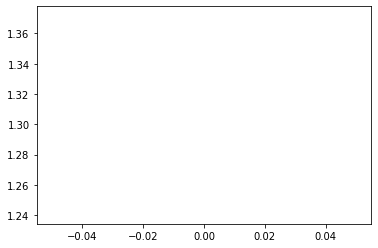

In [ ]:
plt.plot(np.arange(len(epoch_cost)), epoch_cost, label='Epoch Losses')

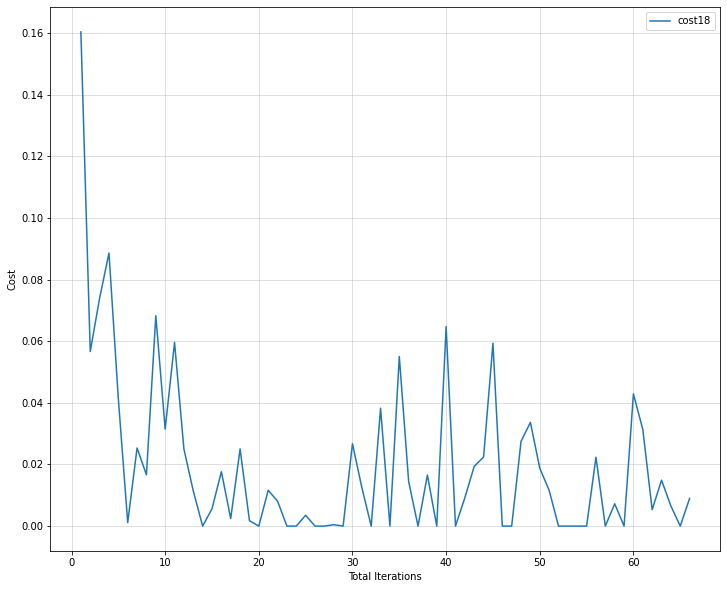

In [ ]:
plt.figure(figsize=(12,10))
plt.xlabel('Total Iterations')
plt.ylabel('Cost')
# plt.plot(np.arange(len(cost)), cost, label='cost')
plt.plot(np.arange(len(cost18)), cost18, label='cost18')
# plt.plot(np.arange(len(cost26)), cost26, label='cost26')
# plt.plot(np.arange(len(train_acc)), train_acc, label='train_acc')
# plt.plot(np.arange(len(test_acc)), test_acc, label='test_acc')
plt.grid(alpha=0.5)
plt.legend()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/siamese-orl-loss on 38classes(resnet18)6')
plt.show()

In [ ]:
plt.figure(figsize=(12,10))
plt.xlabel('Total Iterations')
plt.ylabel('Accuracy')
plt.plot(np.arange(len(train_acc)), train_acc, label='train_acc')
plt.plot(np.arange(len(test_acc)), test_acc, label='test_acc')
plt.grid(alpha=0.5)
plt.legend()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/siamese-orl-loss on 30classes(resnet)')
plt.show()

In [ ]:
torch.set_grad_enabled(False)
resnet18.train(False)
# resnet26.train(False)

In [ ]:
resnet18.cuda()

In [1]:
total_enc = torch.stack([resnet18.semi_forward(img.cuda()).cpu() for img in tqdm(dataset)])
total_enc.shape


100%|██████████| 40/40 [00:01<00:00, 39.69it/s]
torch.Size([40, 10, 128])



In [ ]:
train_enc = total_enc[0:38,:7,...]
train_enc.shape

torch.Size([38, 7, 128])

In [ ]:
test_enc = total_enc[0:38,7:,...]
test_enc.shape

torch.Size([38, 3, 128])

In [ ]:
test2_enc = total_enc[38:]
test2_enc.shape

torch.Size([2, 10, 128])

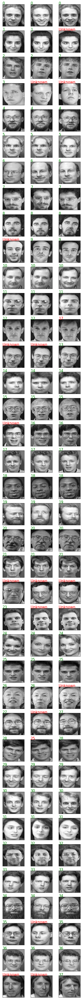

In [ ]:
# ## Showing test dataset
# grid = torchvision.utils.make_grid(test.reshape(38*3,1,224,224), nrow=3, pad=100)
# plt.figure(figsize=(30,120))
# plt.imshow(np.transpose(grid, (1,2,0)))
threshold = 5
pred_matrix_test = []
shape = test_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))
 
for i in range(shape[0]):
 
    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(test[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,test_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-2)
            
    pred_matrix_test.append(pred_class)
 
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:38,7:,...]3.png', dpi=200)
plt.show()

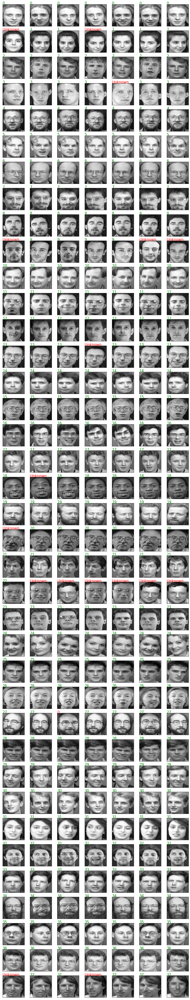

In [ ]:
threshold = 5
pred_matrix_train = []
shape = train_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))

for i in range(shape[0]):

    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(train[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,train_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-1)
            
    pred_matrix_train.append(pred_class)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:38,:7,...]3.png', dpi=200)
plt.show()

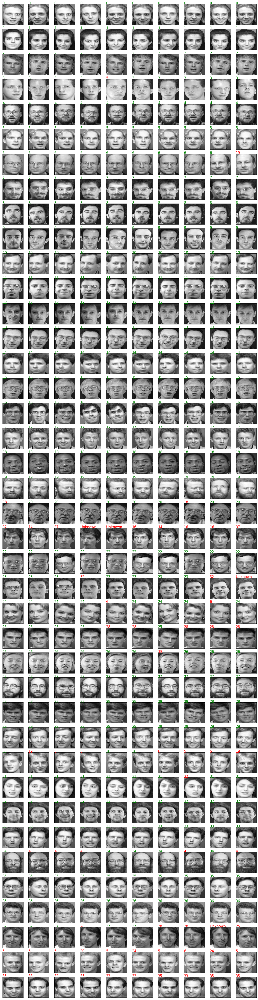

In [ ]:
threshold = 5
pred_matrix_total = []
shape = total_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))

for i in range(38):

    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(dataset[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,total_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-1)
            
    pred_matrix_total.append(pred_class)

for i in range(38,40):

    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(dataset[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,total_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='green', fontsize=15)
            pred_class.append(-2)
        else:
            axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
            pred_class.append(-1)
            
    pred_matrix_total.append(pred_class)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:40,:,...]3.png', dpi=200)
plt.show()

In [ ]:
def get_pred(batch_enc, train_enc, threshold=5):
    shape = batch_enc.shape    
    pred_matrix = np.full((shape[0],shape[1]), -1)
    for i in range(shape[0]):
    
        for j in range(shape[1]):
            
            mean_dists = torch.mean(dist(train_enc,batch_enc[i][j]) , dim=1)
            pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

            if pred_idx == -1: # -1 for un recognized
                pred_matrix[i][j] = -1
            else:
                if pred_idx == i:
                    pred_matrix[i][j] = pred_idx
                else:
                    pred_matrix[i][j] = -2  # -2 for wrong recognition
            
    correct = (pred_matrix > -1).sum() #/ (shape[0]*shape[1])
    unknown = (pred_matrix == -1).sum() #/ (shape[0]*shape[1])
    wrong   = (pred_matrix == -2).sum() #/ (shape[0]*shape[1])
    t = (shape[0]*shape[1])
    print("Correct : {:.2f}% [{} out of {}]".format(correct/t*100, correct, t))
    print("Unknown : {:.2f}% [{} out of {}]".format(unknown/t*100, unknown, t))
    print("Wrong   : {:.2f}% [{} out of {}]".format(wrong/t*100, wrong, t))
    return pred_matrix

In [ ]:
def dist(enc1,enc2):
    return (enc1 - enc2).pow(2).sum(-1)#.pow(.5)

In [ ]:
test_pred = get_pred(test_enc, train_enc, 10)

Correct : 83.33% [95 out of 114]
Unknown : 0.00% [0 out of 114]
Wrong   : 16.67% [19 out of 114]


In [ ]:
train_pred = get_pred(train_enc, train_enc, 10)

Correct : 88.35% [235 out of 266]
Unknown : 0.00% [0 out of 266]
Wrong   : 11.65% [31 out of 266]


In [ ]:
test2_pred = get_pred(test2_enc, train_enc, 10)

Correct : 0.00% [0 out of 20]
Unknown : 0.00% [0 out of 20]
Wrong   : 100.00% [20 out of 20]


In [ ]:
test_pred

array([[ 0,  0,  0],
       [ 1,  1,  1],
       [ 2,  2,  2],
       [ 3,  3,  3],
       [ 4,  4,  4],
       [ 5,  5,  5],
       [ 6,  6, -2],
       [ 7,  7,  7],
       [ 8,  8,  8],
       [ 9,  9,  9],
       [10, 10, 10],
       [11, 11, 11],
       [12, 12, 12],
       [13, 13, 13],
       [14, 14, 14],
       [15, 15, 15],
       [16, 16, 16],
       [17, 17, 17],
       [18, 18, 18],
       [19, 19, 19],
       [-2, 20, 20],
       [-2, -2, -2],
       [22, 22, 22],
       [23, -2, -1],
       [24, -2, 24],
       [-2, -2, -2],
       [26, 26, 26],
       [27, 27, 27],
       [28, 28, 28],
       [29, 29, 29],
       [-2, -2, -2],
       [-2, 31, 31],
       [32, 32, 32],
       [33, 33, 33],
       [-2, 34, -2],
       [35, 35, 35],
       [36, 36, 36],
       [-2, -1, -2]])

tensor(1.5739)
Predicted Class :  21


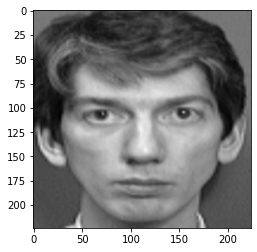

In [ ]:
### show image
Class = 21
idx = 8
plt.imshow(dataset[Class][idx].squeeze(), cmap='gray')
mean_dists = torch.mean(dist(train_enc,total_enc[Class][idx]) , dim=1)
pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < 10) else -1
print(mean_dists.min())

if pred_idx == -1:
    print("Unknown Person")
else:
    print("Predicted Class : ", pred_idx)

In [ ]:
mean_dists

tensor([27.5228,  4.5330, 11.4757, 24.6575,  9.5274, 30.4732, 23.8316, 11.0615,
         5.8970,  7.8663, 27.5295, 15.6084,  6.5356,  9.2680, 13.5982, 12.8871,
         2.4789,  2.2653,  5.0412, 38.4094,  5.8787,  1.5739,  6.2061,  4.3740,
        20.9999,  3.7613, 16.7660, 12.8536,  4.0261, 17.6983, 25.5115,  9.8177,
         8.1757,  7.2585, 13.2229, 10.2973, 22.0732,  2.6986])

In [ ]:
total_enc[Class-3][idx].nonzero().squeeze()

tensor([  1,   2,   3,   5,   8,  12,  13,  14,  15,  16,  17,  26,  28,  29,
         31,  32,  33,  34,  35,  37,  38,  40,  42,  44,  45,  46,  48,  49,
         50,  52,  57,  58,  60,  61,  62,  63,  65,  66,  67,  68,  69,  70,
         71,  74,  75,  77,  80,  82,  83,  84,  85,  86,  89,  90,  91,  92,
         93,  95,  96,  97,  99, 100, 102, 103, 105, 106, 107, 114, 116, 117,
        118, 119, 122, 124, 125, 126, 127])

In [ ]:
total_enc[Class-1][idx-4].nonzero().squeeze()

tensor([  1,   2,   3,   5,   8,  12,  13,  14,  15,  16,  17,  25,  26,  28,
         29,  31,  32,  33,  34,  35,  37,  38,  40,  42,  44,  45,  46,  48,
         49,  50,  52,  57,  58,  60,  61,  62,  63,  65,  66,  67,  68,  69,
         70,  71,  74,  75,  76,  77,  80,  82,  83,  84,  85,  86,  89,  90,
         91,  92,  93,  95,  96,  97,  99, 100, 102, 103, 105, 106, 107, 114,
        116, 117, 118, 119, 122, 124, 125, 126, 127])

In [ ]:
total_enc[Class][idx].nonzero().squeeze()

tensor([  0,   3,   4,   7,  11,  15,  16,  17,  18,  22,  23,  26,  28,  36,
         37,  39,  42,  43,  44,  47,  48,  49,  53,  54,  55,  57,  61,  63,
         65,  69,  70,  74,  79,  81,  84,  85,  86,  88,  89,  90,  91,  92,
         93,  94,  95,  97,  98,  99, 100, 102, 103, 104, 105, 106, 107, 112,
        117, 119, 121, 123, 124, 127])

In [ ]:
# extract a single face from a given photograph
def extract_face(image, required_size=(224, 224)):
    # image = cv2.imread('avatar.jpg')
    # detect faces in the image
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(image)
    if len(results) < 1:
        return None
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height

    face = image[y1:y2, x1:x2]
    face = cv2.resize(face, required_size)
    gray = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
    return gray, (results[0]['box'])

In [ ]:
torch.cuda.empty_cache()

In [ ]:
image = cv2.imread('avatar.jpg')
face, box = extract_face(image)

image2 = cv2.imread('photo.jpg')
face2, box2 = extract_face(image2)

image3 = cv2.imread('abdu.JPG')
face3, box3 = extract_face(image3)

image4 = cv2.imread('AW_face.jpg')
face4, box4 = extract_face(image4)

In [ ]:
_, axxar = plt.subplots(2,4, figsize=(10,7))
axxar[0][0].imshow(face, cmap='gray')
axxar[0][1].imshow(face2, cmap='gray')
axxar[0][2].imshow(face3, cmap='gray')
axxar[0][3].imshow(face4, cmap='gray')

axxar[1][0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axxar[1][0].add_patch(patches.Rectangle((box[0], box[1]),box[2], box[3], fill=False, lw=3, ec='g'))

axxar[1][1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
axxar[1][1].add_patch(patches.Rectangle((box2[0], box2[1]),box2[2], box2[3], fill=False, lw=3, ec='g'))

axxar[1][2].imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
axxar[1][2].add_patch(patches.Rectangle((box3[0], box3[1]),box3[2], box3[3], fill=False, lw=3, ec='g'))

axxar[1][3].imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
axxar[1][3].add_patch(patches.Rectangle((box4[0], box4[1]),box4[2], box4[3], fill=False, lw=3, ec='g'))

In [ ]:
class Normalize(torch.nn.Module):
    def __init__(self,inplace=True):
        super().__init__()
        self.inplace = inplace

    def forward(self, tensor: torch.Tensor) -> torch.Tensor:
        """
        Args:
            tensor (Tensor): Tensor image to be normalized.

        Returns:
            Tensor: Normalized Tensor image.
        """
        mean = tensor.mean()
        std = tensor.std()
        return transforms.functional.normalize(tensor, mean, std, self.inplace)

 # ref : https://pytorch.org/vision/stable/_modules/torchvision/transforms/transforms.html#Normalize

In [ ]:
process = transforms.Compose([
    transforms.ToTensor(),
    Normalize(),
])

In [ ]:
face_tensor = process(face)
face_tensor2 = process(face2)
face_tensor3 = process(face3)
face_tensor4 = process(face4)

In [ ]:
face_tensor.shape, face_tensor2.shape, face_tensor3.shape, face_tensor4.shape

(torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]))

In [ ]:
face_enc = resnet18.semi_forward(face_tensor.unsqueeze(0).cuda()).cpu()
face_enc2 = resnet18.semi_forward(face_tensor2.unsqueeze(0).cuda()).cpu()
face_enc3 = resnet18.semi_forward(face_tensor3.unsqueeze(0).cuda()).cpu()
face_enc4 = resnet18.semi_forward(face_tensor4.unsqueeze(0).cuda()).cpu()

In [ ]:
faces = torch.stack([face_enc, face_enc2, face_enc3, face_enc4])

In [ ]:
face_dist = dist(faces, face_enc)
face_dist

tensor([[0.0000],
        [1.7992],
        [2.6282],
        [1.4090]])

In [ ]:
(face_enc - face_enc4).pow(2).sum()

tensor(15.9237)

In [ ]:
!pip install face-recognition

In [ ]:
# import face_recognition
known_image = face_recognition.load_image_file("AW_face.jpg")
unknown_image = face_recognition.load_image_file("avatar.jpg")

biden_encoding = face_recognition.face_encodings(known_image)[0]
unknown_encoding = face_recognition.face_encodings(unknown_image)[0]

results = face_recognition.compare_faces([biden_encoding], unknown_encoding)

In [ ]:
results

[False]

In [ ]:
pca = PCA(n_components=2)
x = total_enc[7:12].detach()
principalComponents = [pca.fit_transform(i) for i in x]

In [ ]:
len(principalComponents), principalComponents[2].shape

(5, (10, 2))

In [ ]:
def plot_embeddings(principalComponents, targets):
    # plt.figure(figsize=(15,15))
    plt.figure()
    for i,pc in enumerate(principalComponents) :
        plt.scatter(pc[:,0], pc[:,1], alpha=0.5, label=f'{targets[i]}')
    plt.legend()
    plt.show()

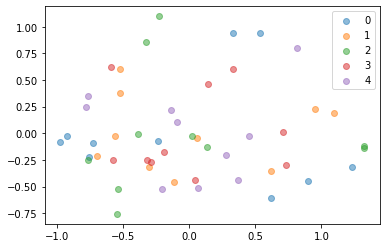

In [ ]:
plot_embeddings(principalComponents, list(range(5)))

In [ ]:
resnet18 = ResNet()
resnet18.cuda()

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (block1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (block2): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(

In [ ]:
# Saving the state_dict of Model
PATH = '/content/drive/MyDrive/Colab Notebooks/siamese-orl(resnet)1.pth'

In [ ]:
# torch.save(resnet18.state_dict(), PATH)

In [ ]:
# resnet18.load_state_dict(torch.load(PATH,  map_location=torch.device('cpu')))
resnet18.load_state_dict(torch.load(PATH))
resnet18.eval()